#Create a Google Drive folder path

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd /content/drive/MyDrive

/content/drive/MyDrive


# Import Libraries

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm.notebook import tqdm
from random import shuffle
import torch
from torch import nn
import math
from glob import glob
import sys
import shutil

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


%matplotlib inline

# Create a folder in MyDrive
Create a folder in MyDrive named "UNet-AerialSegmentation"
and Change directory pointing this folder

In [4]:
cd /content/drive/MyDrive/Aerial/UNet-AerialSegmentation

/content/drive/MyDrive/Aerial/UNet-AerialSegmentation


# Download data
Download "Semantic segmentation of aerial imagery” Dataset and upload the dataset in the "UNet-AerialSegmentation" folder

# Data loader and data augmentation

In [5]:
import os
import numpy as np
import torch
import torch.utils.data
import torchvision.transforms as transforms
import cv2
import glob
from scipy import ndimage

class segDataset(torch.utils.data.Dataset):
    def __init__(self, root, training, transform=None):
        super(segDataset, self).__init__()
        self.root = root
        self.training = training  # True for train/val, False for test
        self.transform = transform
        self.IMG_NAMES = sorted(glob.glob(os.path.join(self.root, 'Images', '*.png')))

        # UAVid dataset class mapping (RGB format)
        self.RGB_classes = {
            'Background clutter': (0, 0, 0),
            'Building': (128, 0, 0),
            'Road': (128, 64, 128),
            'Tree': (0, 128, 0),
            'Low vegetation': (128, 128, 0),
            'Moving car': (64, 0, 128),
            'Static car': (192, 0, 192),
            'Human': (64, 64, 0)
        }

        self.bin_classes = list(self.RGB_classes.keys())

    def __getitem__(self, idx):
        img_path = self.IMG_NAMES[idx]

        #  Load Image
        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(f"Error: Image file not found at {img_path}")

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # If Training, Load Mask
        if self.training:
            mask_path = img_path.replace('Images', 'Labels')

            mask = cv2.imread(mask_path)
            if mask is None:
                raise FileNotFoundError(f"Error: Mask file not found at {mask_path}")

            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

            # Convert RGB mask to class indices
            cls_mask = np.zeros(mask.shape[:2], dtype=np.int64)
            for i, (cls_name, cls_color) in enumerate(self.RGB_classes.items()):
                cls_mask[np.all(mask == cls_color, axis=-1)] = i

            #  Data Augmentations (Only for Training)
            if self.transform:
                image = transforms.functional.to_pil_image(image)
                image = self.transform(image)
                image = np.array(image)

            if np.random.rand() < 0.5:
                angle = np.random.randint(4) * 90
                image = ndimage.rotate(image, angle, reshape=False)
                cls_mask = ndimage.rotate(cls_mask, angle, reshape=False)

            if np.random.rand() < 0.5:
                image = np.flipud(image)
                cls_mask = np.flipud(cls_mask)
            if np.random.rand() < 0.5:
                image = np.fliplr(image)
                cls_mask = np.fliplr(cls_mask)

            # Resize Image and Mask
            image = cv2.resize(image, (512, 512)) / 255.0
            cls_mask = cv2.resize(cls_mask, (512, 512), interpolation=cv2.INTER_NEAREST)

            # Convert to PyTorch tensors
            image = np.moveaxis(image, -1, 0)  # (H, W, C) → (C, H, W)
            return torch.tensor(image).float(), torch.tensor(cls_mask, dtype=torch.int64)

        else:
            # For Test Data: No Mask, Only Image
            image = cv2.resize(image, (512, 512)) / 255.0
            image = np.moveaxis(image, -1, 0)  # (H, W, C) → (C, H, W)
            return torch.tensor(image).float()

    def __len__(self):
        return len(self.IMG_NAMES)


In [6]:
color_shift = transforms.ColorJitter(0.1, 0.1, 0.1, 0.1)
blurriness = transforms.GaussianBlur(3, sigma=(0.1, 2.0))

t = transforms.Compose([color_shift, blurriness])

dataset = segDataset('/content/drive/MyDrive/Aerial/UNet-AerialSegmentation/Modified UAVid/train_data',
                     training=True, transform=t)

print(len(dataset))  # Check dataset length


200


In [ ]:
img, mask = dataset[0]
transforms.ToPILImage()(img).show()

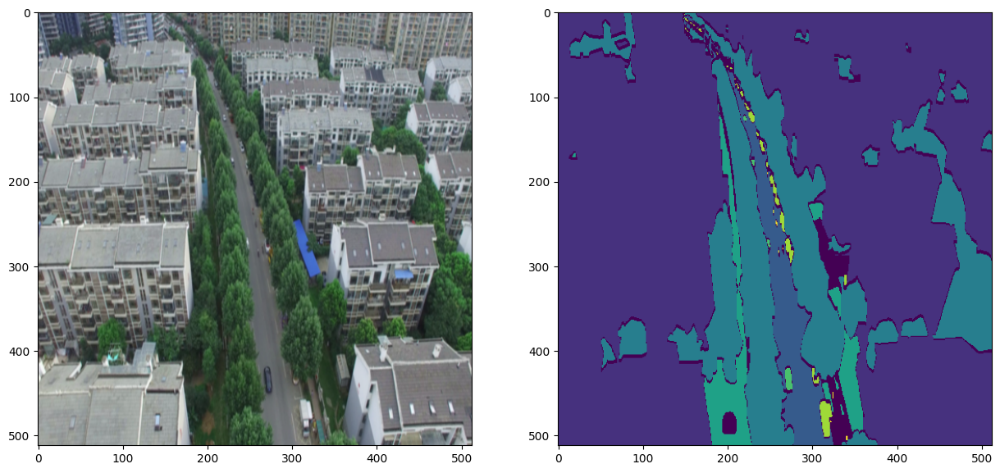

In [8]:
d = dataset[73]
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(np.moveaxis(d[0].numpy(),0,-1))
plt.subplot(1,2,2)
plt.imshow(d[1].numpy())

In [9]:
from torch.utils.data import DataLoader

train_dataset = segDataset('/content/drive/MyDrive/Aerial/UNet-AerialSegmentation/Modified UAVid/train_data',
                           training=True, transform=t)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_dataset = segDataset('/content/drive/MyDrive/Aerial/UNet-AerialSegmentation/Modified UAVid/val_data',
                         training=True, transform=None)

test_dataset = segDataset('/content/drive/MyDrive/Aerial/UNet-AerialSegmentation/Modified UAVid/test_data',
                          training=False, transform=None)

val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)



In [10]:
BATCH_SIZE = 8

train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


# U-net model

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Define the number of output classes based on UAVid dataset
NUM_CLASSES = 8  # UAVid has 8 semantic segmentation classes

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    """Final output layer with n_classes output channels"""

    def __init__(self, in_channels, out_channels):  # Accepts both in_channels and out_channels
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)  # No hardcoded NUM_CLASSES

    def forward(self, x):
        return self.conv(x)


In [12]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)  # Now correctly passes n_classes

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits


#Focal loss

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=None, reduction="mean"):
        """
        Focal Loss for imbalanced classification.

        Args:
            gamma (float): Focusing parameter.
            alpha (list, float, or None): Class weighting factor.
            reduction (str): "mean", "sum", or "none" (PyTorch standard).
        """
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.reduction = reduction

        if isinstance(alpha, (float, int)):
            self.alpha = torch.tensor([alpha, 1 - alpha])  # Binary classification case

        if isinstance(alpha, list):
            self.alpha = torch.tensor(alpha)  # Multi-class case

    def forward(self, input, target):
        """
        Computes focal loss.

        Args:
            input (torch.Tensor): Model predictions (logits) of shape (N, C, H, W).
            target (torch.Tensor): Ground truth labels of shape (N, H, W).

        Returns:
            torch.Tensor: Computed focal loss.
        """
        if input.dim() > 2:
            input = input.view(input.size(0), input.size(1), -1)  # Flatten H & W
            input = input.transpose(1, 2)  # Swap channels
            input = input.contiguous().view(-1, input.size(2))  # Reshape for CE loss

        target = target.view(-1).long()  # Flatten target and ensure correct dtype

        logpt = F.log_softmax(input, dim=-1)  # Compute log-probabilities
        logpt = logpt.gather(1, target.unsqueeze(1)).squeeze(1)  # Get true class log-prob

        pt = logpt.exp()  # Convert log-prob to prob

        # Apply alpha weighting if provided
        if self.alpha is not None:
            self.alpha = self.alpha.to(input.device)  # Move alpha to correct device
            at = self.alpha.gather(0, target)
            logpt = logpt * at

        # Compute focal loss
        loss = -((1 - pt) ** self.gamma) * logpt

        # Apply reduction
        if self.reduction == "mean":
            return loss.mean()
        elif self.reduction == "sum":
            return loss.sum()
        return loss  # Return raw loss (for "none" mode)


In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set alpha for class balancing (optional)
alpha_weights = None  # Replace with a list if needed

criterion = FocalLoss(gamma=2, alpha=alpha_weights).to(device)  # Gamma=2 for better imbalance handling


# IoU-Based loss

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class mIoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True, n_classes=8):  # Updated for UAVid
        super(mIoULoss, self).__init__()
        self.classes = n_classes

    def to_one_hot(self, tensor):
        """Convert target to one-hot encoding"""
        n, h, w = tensor.size()
        one_hot = torch.zeros(n, self.classes, h, w).to(tensor.device).scatter_(1, tensor.view(n, 1, h, w), 1)
        return one_hot

    def forward(self, inputs, target):
        """Calculate mIoU loss"""
        N = inputs.size(0)

        # Ensure target shape is (N, H, W)
        if target.dim() == 4 and target.shape[1] == 1:
            target = target.squeeze(1)

        # Apply softmax to inputs
        inputs = F.softmax(inputs, dim=1)

        # Convert target to one-hot encoding
        target_oneHot = self.to_one_hot(target)

        # Intersection: sum over all pixels
        inter = (inputs * target_oneHot).view(N, self.classes, -1).sum(2)

        # Union: sum over all pixels + small epsilon to prevent div by zero
        union = (inputs + target_oneHot - (inputs * target_oneHot)).view(N, self.classes, -1).sum(2) + 1e-6

        # Compute IoU per class, then average over classes and batch
        loss = inter / union
        return 1 - loss.mean()


In [16]:
criterion = mIoULoss(n_classes=8).to(device)

# Training task and Accuracy metrics computation

In [17]:
def acc(label, predicted):
    label = label.cpu()
    predicted_class = torch.argmax(predicted, dim=1).cpu()

    correct = (label == predicted_class).sum().float()
    total = torch.numel(label)  # Total pixels

    seg_acc = correct / (total + 1e-7)  # Avoid division by zero

    return seg_acc  # Now returns a tensor, not a float


In [18]:
import torch

def recall_m(y_true, y_pred):
    y_pred_class = torch.argmax(y_pred, dim=1).cpu()
    y_true = y_true.cpu()

    true_positives = (y_true == y_pred_class).sum().float()
    possible_positives = (y_true >= 0).sum().float()  # Count only valid pixels

    recall = true_positives / (possible_positives + 1e-7)  # Avoid division by zero
    return recall

def precision_m(y_true, y_pred):
    y_pred_class = torch.argmax(y_pred, dim=1).cpu()
    y_true = y_true.cpu()

    true_positives = (y_true == y_pred_class).sum().float()
    predicted_positives = (y_pred_class >= 0).sum().float()  # Count only valid pixels

    precision = true_positives / (predicted_positives + 1e-7)  # Avoid division by zero
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)

    f1_score = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid division by zero
    return f1_score


In [19]:
min_loss = torch.inf  # More readable

# Define the model with 8 classes (UAVid has 8 segmentation classes)
model = UNet(n_channels=3, n_classes=8, bilinear=True).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)  # Added weight decay
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)  # Decrease LR every 10 epochs


In [11]:
import os
import torch
import numpy as np
import sys

os.makedirs('./uav_saved_models', exist_ok=True)  #  Ensure save directory exists

N_EPOCHS = 40
N_DATA = len(train_dataset)
N_TEST = len(test_dataset)

plot_losses = []
plot_prec = []
plot_recall = []
plot_f1_score = []
scheduler_counter = 0
min_loss = float('inf')  # Initialize min_loss

for epoch in range(N_EPOCHS):
    # Training
    model.train()
    loss_list = []
    acc_list = []
    prec_list = []
    recall_list = []
    f1_list = []

    for batch_i, (x, y) in enumerate(train_loader):
        x, y = x.to(device), y.to(device)  # Move to GPU

        optimizer.zero_grad()  # ✅ Move before loss.backward()

        pred_mask = model(x)
        loss = criterion(pred_mask, y)

        loss.backward()
        optimizer.step()

        # ✅ Compute once and reuse
        pred_mask_cpu = pred_mask.cpu().detach()
        y_cpu = y.cpu()

        loss_list.append(loss.cpu().detach().numpy())
        acc_list.append(acc(y_cpu, pred_mask_cpu).item())
        recall_list.append(recall_m(y_cpu, pred_mask_cpu).numpy())
        prec_list.append(precision_m(y_cpu, pred_mask_cpu).numpy())
        f1_list.append(f1_m(y_cpu, pred_mask_cpu).numpy())

        sys.stdout.write("\r[Epoch %d/%d] [Batch %d/%d] [Loss: %f (%f)]" % (
            epoch, N_EPOCHS, batch_i, len(train_dataloader), loss.cpu().detach().numpy(), np.mean(loss_list)
        ))
        sys.stdout.flush()  # ✅ Ensure immediate output

    scheduler_counter += 1

    # Validation
    model.eval()
    val_loss_list = []
    val_acc_list = []
    val_prec_list = []
    val_recall_list = []
    val_f1_list = []

    with torch.no_grad():  # ✅ Use a single `torch.no_grad()`
        for batch_i, (x, y) in enumerate(val_loader):  # ✅ Use validation data with labels
            x, y = x.to(device), y.to(device)

            pred_mask = model(x)
            val_loss = criterion(pred_mask, y)

            pred_mask_cpu = pred_mask.cpu().detach()
            y_cpu = y.cpu()

            val_loss_list.append(val_loss.cpu().detach().numpy())
            val_acc_list.append(acc(y_cpu, pred_mask_cpu).numpy())
            val_prec_list.append(precision_m(y_cpu, pred_mask_cpu).numpy())
            val_recall_list.append(recall_m(y_cpu, pred_mask_cpu).numpy())
            val_f1_list.append(f1_m(y_cpu, pred_mask_cpu).numpy())

    print('Epoch {} - Loss: {:.5f} - Acc: {:.2f} - Val Loss: {:.5f} - Val Acc: {:.2f} - Prec: {:.2f} - Recall: {:.2f} - F1: {:.2f} - Val Prec: {:.2f} - Val Recall: {:.2f} - Val F1: {:.2f}'.format(
        epoch, np.mean(loss_list), np.mean(acc_list), np.mean(val_loss_list),
        np.mean(val_acc_list), np.mean(prec_list), np.mean(recall_list),
        np.mean(f1_list), np.mean(val_prec_list), np.mean(val_recall_list),
        np.mean(val_f1_list)
    ))

    # ✅ Append to plots
    plot_losses.append([epoch, np.mean(loss_list), np.mean(val_loss_list)])
    plot_prec.append([epoch, np.mean(prec_list), np.mean(val_prec_list)])
    plot_recall.append([epoch, np.mean(recall_list), np.mean(val_recall_list)])
    plot_f1_score.append([epoch, np.mean(f1_list), np.mean(val_f1_list)])

    # ✅ Save Best Model
    compare_loss = np.mean(val_loss_list)
    is_best = compare_loss < min_loss

    if is_best:
        scheduler_counter = 0
        min_loss = compare_loss
        torch.save(model.state_dict(), './uav_saved_models/unet_epoch_{}_{:.5f}.pt'.format(epoch, compare_loss))  # ✅ Changed path

    # ✅ Adaptive Learning Rate Scheduler
    lr_scheduler.step(compare_loss)  # Adjust LR based on val loss

# ✅ TEST DATASET: Predicting Labels
model.eval()
test_predictions = []  # Store predictions

with torch.no_grad():
    for batch_i, x in enumerate(test_loader):  # ✅ Unpack only `x`
        x = x.to(device)

        pred_mask = model(x)  # Get predictions

        pred_mask = pred_mask.cpu().numpy()  # Move to CPU for saving

        test_predictions.append(pred_mask)  # Store predictions

print("✅ Test predictions complete. You can now save them as PNG files or analyze them.")


[Epoch 0/40] [Batch 24/25] [Loss: 0.758616 (0.741210)] Epoch 0 - Loss: 0.74121 - Acc: 65.00 - Val Loss: 0.76561 - Val Acc: 64.50 - Prec: 65.13 - Recall: 65.13 - F1: 65.13 - Val Prec: 64.79 - Val Recall: 64.79 - Val F1: 64.79
[Epoch 1/40] [Batch 24/25] [Loss: 0.749501 (0.740970)] Epoch 1 - Loss: 0.74097 - Acc: 66.10 - Val Loss: 0.73843 - Val Acc: 65.60 - Prec: 65.92 - Recall: 65.92 - F1: 65.92 - Val Prec: 65.77 - Val Recall: 65.77 - Val F1: 65.77
[Epoch 2/40] [Batch 24/25] [Loss: 0.740824 (0.735160)] Epoch 2 - Loss: 0.73516 - Acc: 67.50 - Val Loss: 0.75332 - Val Acc: 66.90 - Prec: 67.34 - Recall: 67.34 - F1: 67.34 - Val Prec: 67.20 - Val Recall: 67.20 - Val F1: 67.20
[Epoch 3/40] [Batch 24/25] [Loss: 0.761993 (0.749290)] Epoch 3 - Loss: 0.74929 - Acc: 68.00 - Val Loss: 0.73146 - Val Acc: 67.30 - Prec: 68.49 - Recall: 68.49 - F1: 68.49 - Val Prec: 67.37 - Val Recall: 67.37 - Val F1: 67.37
[Epoch 4/40] [Batch 24/25] [Loss: 0.740656 (0.732020)] Epoch 4 - Loss: 0.73202 - Acc: 69.20 - Val Lo

#Graph Plots

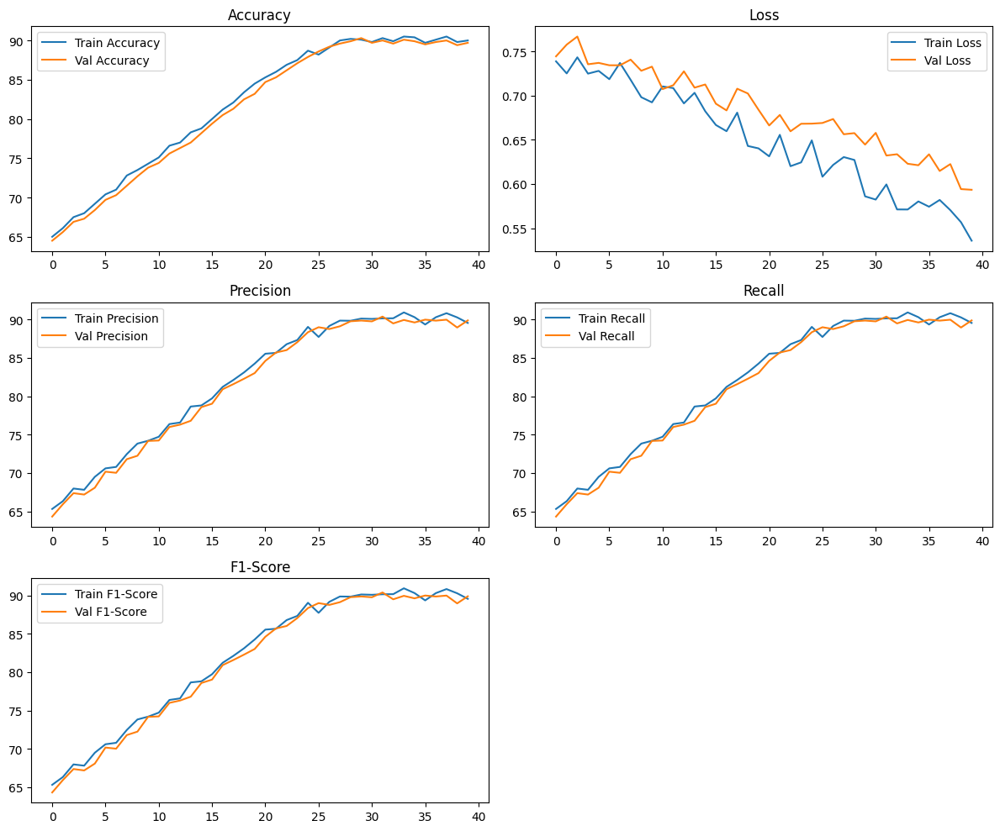

In [13]:
import numpy as np
import matplotlib.pyplot as plt

def plot_metric(data, title, ylabel):
    data = np.array(data)
    plt.figure(figsize=(8, 6))

    # Check if validation data exists (third column)
    if data.shape[1] == 3:
        plt.plot(data[:, 0], data[:, 1], color='b', linewidth=2, label='Training')
        plt.plot(data[:, 0], data[:, 2], color='r', linewidth=2, label='Validation')
    else:
        plt.plot(data[:, 0], data[:, 1], color='b', linewidth=2, label='Training')

    plt.title(title, fontsize=20)
    plt.xlabel('Epoch', fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.legend(fontsize=12)
    plt.grid()
    plt.show()

# Plot Loss
plot_metric(plot_losses, 'mIoU Loss', 'Loss')

# Plot Precision
plot_metric(plot_prec, 'Precision', 'Precision')

# Plot Recall
plot_metric(plot_recall, 'Recall', 'Recall')

# Plot F1-Score
plot_metric(plot_f1_score, 'F1-Score', 'F1-Score')


# Loading a pre-trained model and application of the model on an aerial image

In [ ]:
model.load_state_dict(torch.load('/content/drive/MyDrive/Aerial/UNet-AerialSegmentation/uav_saved_models/unet_epoch_16_0.69226.pt', map_location=torch.device('cpu')))


<ipython-input-22-c29258f0ef8e>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/drive/MyDrive/Aerial/UNet-AerialSegmentation/uav_

<All keys matched successfully>

In [ ]:
print(type(x))  # Check if x is a list or tensor


<class 'list'>


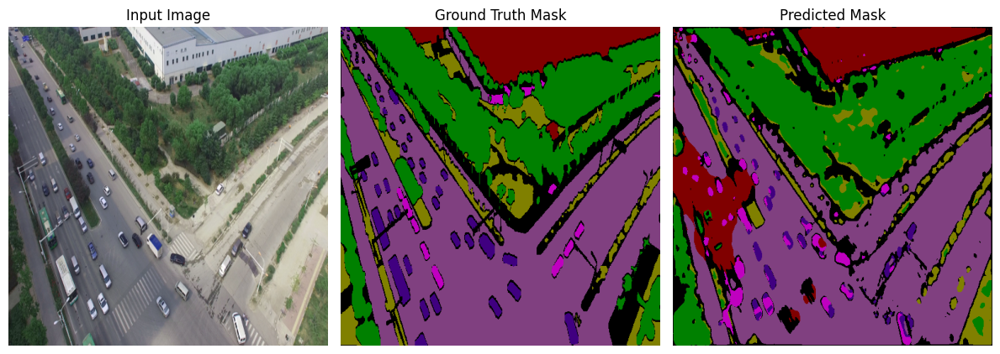

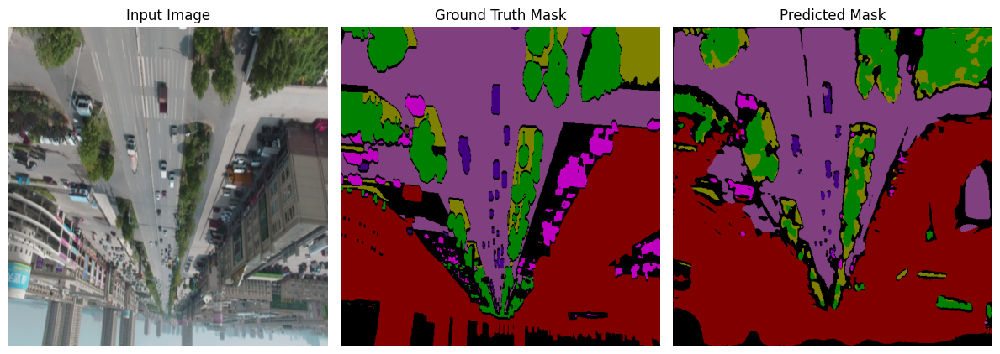

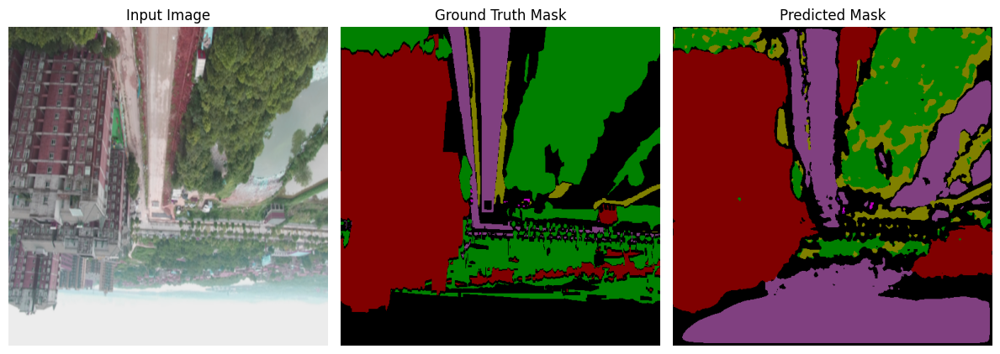

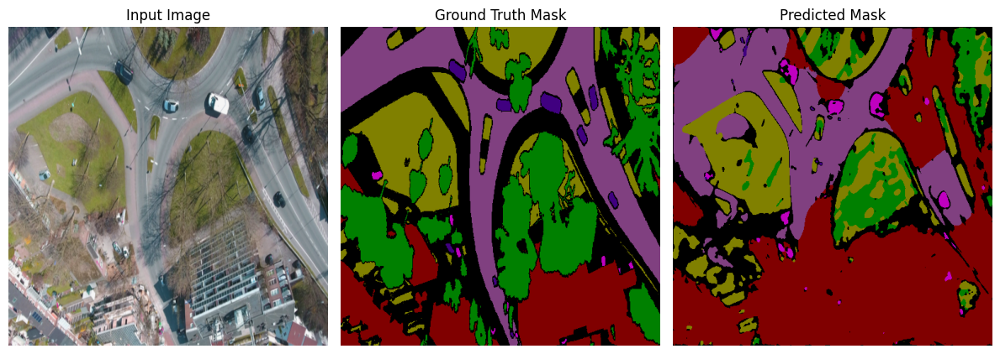

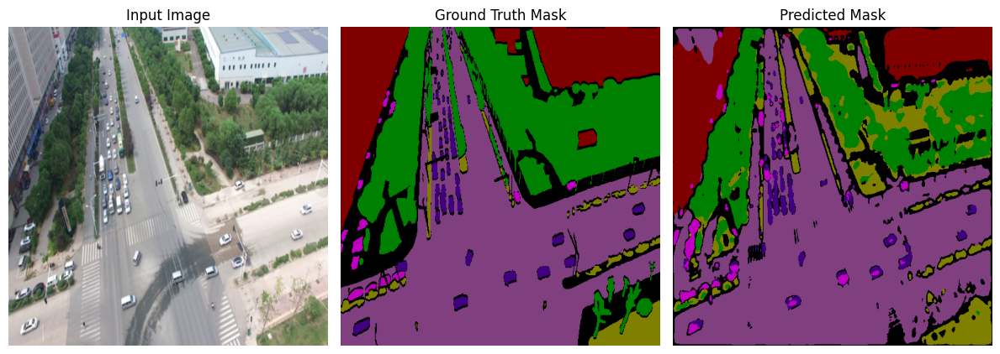

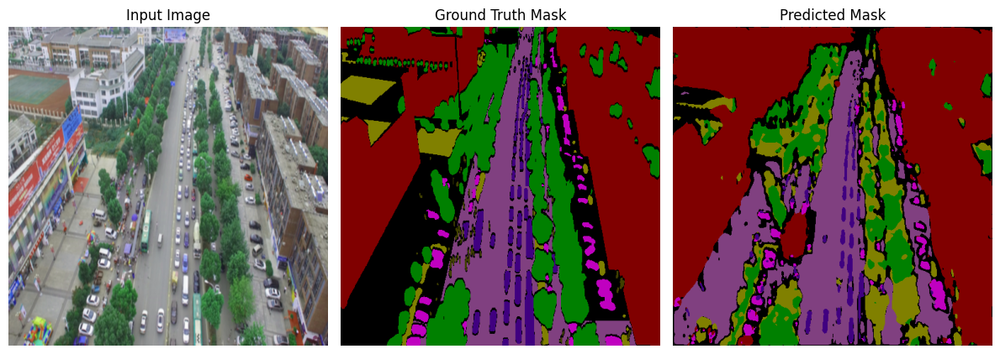

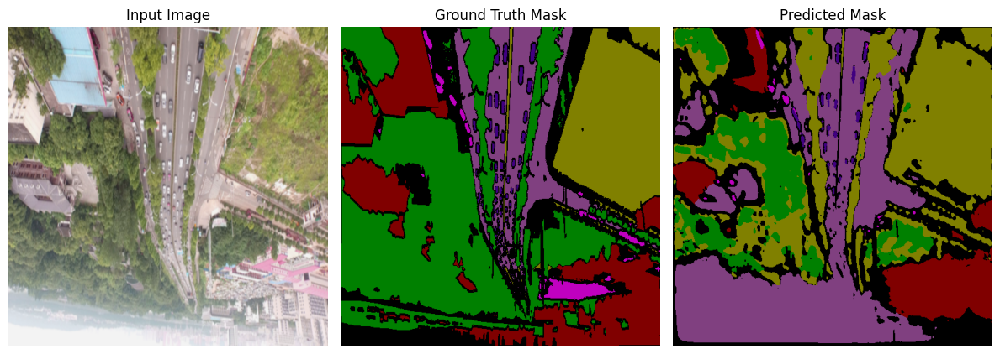

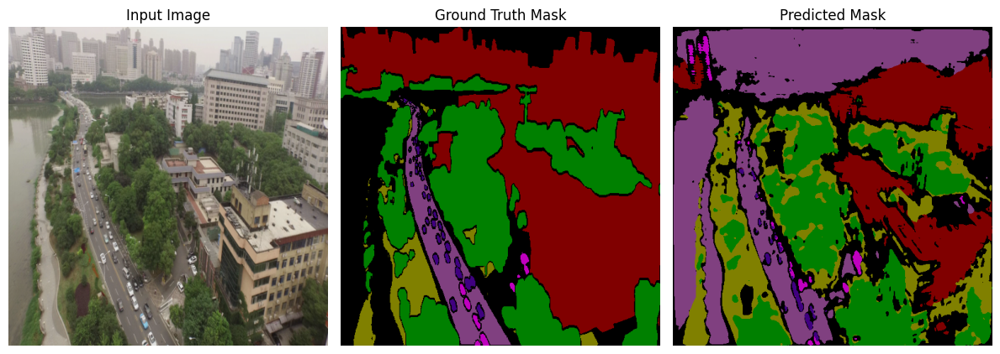

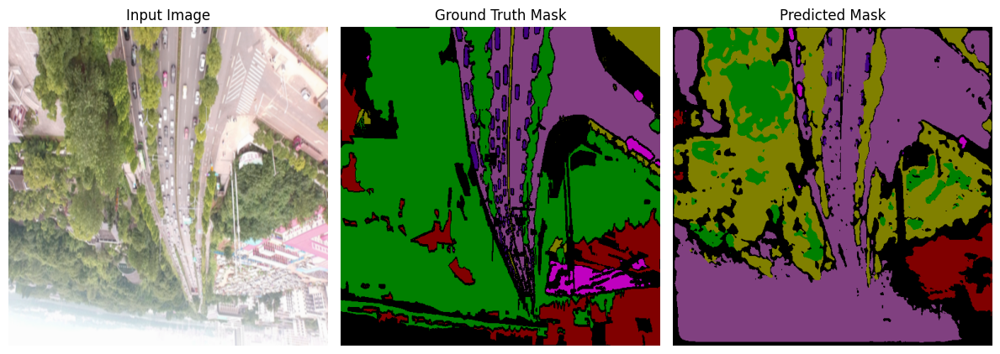

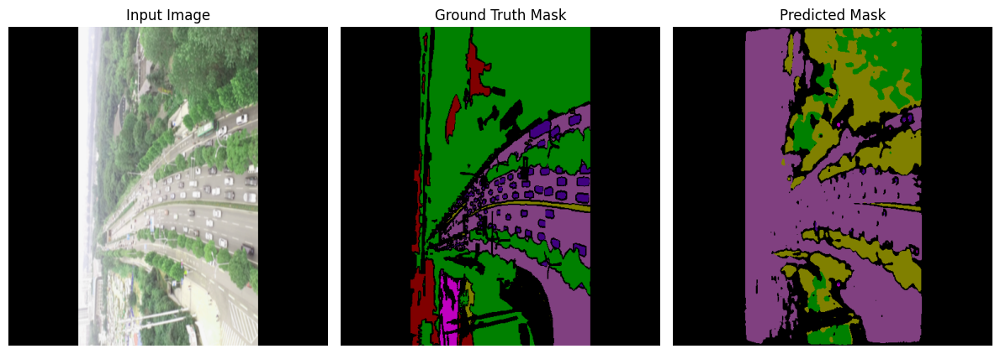

In [ ]:
model.eval()

# Set the number of images to display
num_images_to_display = 10
displayed_images = 0

for batch_i, (x, y) in enumerate(train_loader):
    for j in range(len(x)):
        if displayed_images >= num_images_to_display:
            break  # Stop after showing 10 images

        # Get the predicted result
        result = model(x.to(device)[j:j+1])
        mask = torch.argmax(result, axis=1).cpu().detach().numpy()[0]

        # Prepare the input image for display
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy() * 255
        im = im.astype(int)

        # Ground truth mask (train image only)
        gt_mask = y[j].cpu().detach().numpy()

        # Display the images
        plt.figure(figsize=(12, 12))

        plt.subplot(1, 3, 1)
        plt.imshow(im)
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        # Apply the decode_segmap to the ground truth mask to use colors
        gt_mask_rgb = decode_segmap(gt_mask)
        plt.imshow(gt_mask_rgb)
        plt.title("Ground Truth Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        # Apply the decode_segmap to the predicted mask to use colors
        pred_mask_rgb = decode_segmap(mask)
        plt.imshow(pred_mask_rgb)
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

        displayed_images += 1  # Increment counter

    if displayed_images >= num_images_to_display:
        break  # Stop after showing 10 images


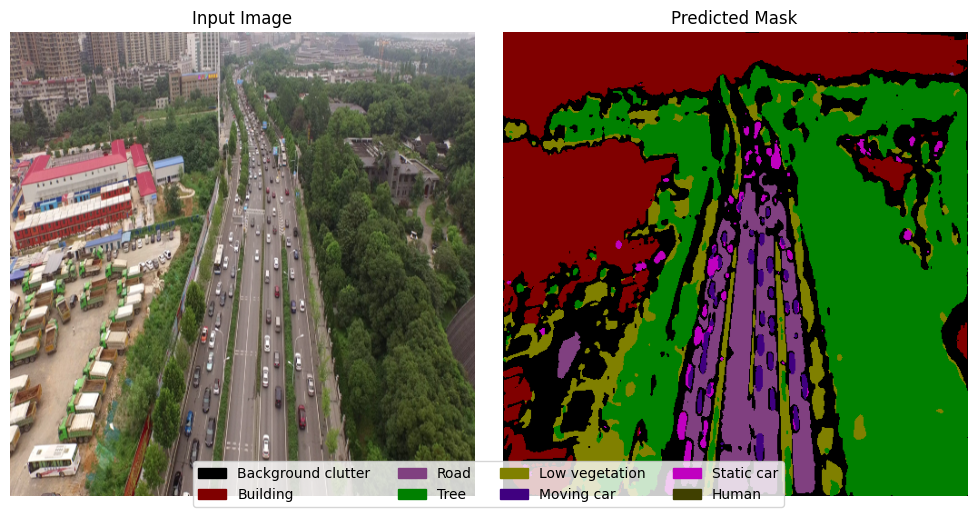

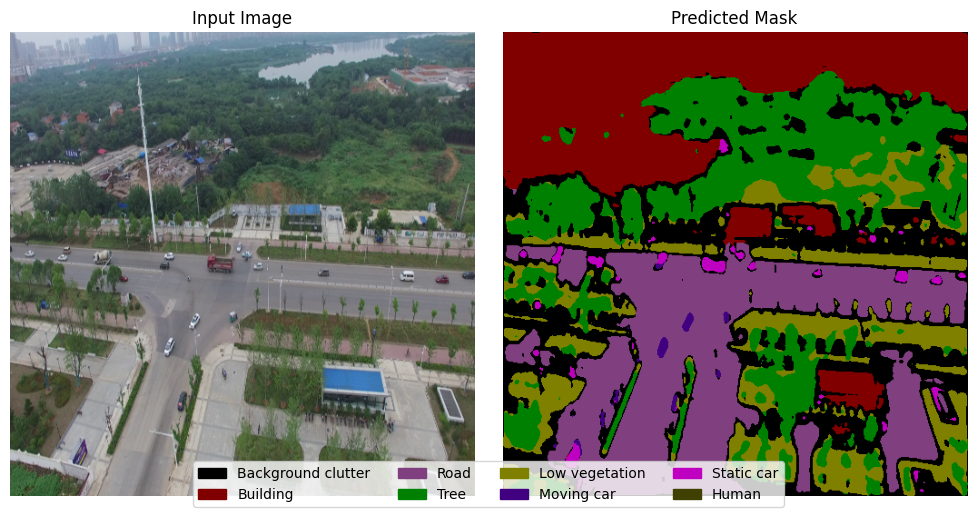

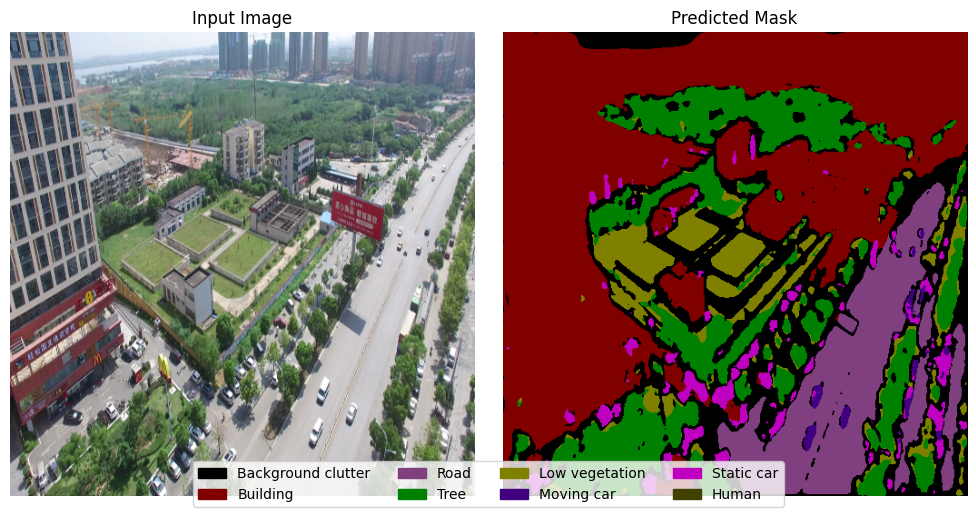

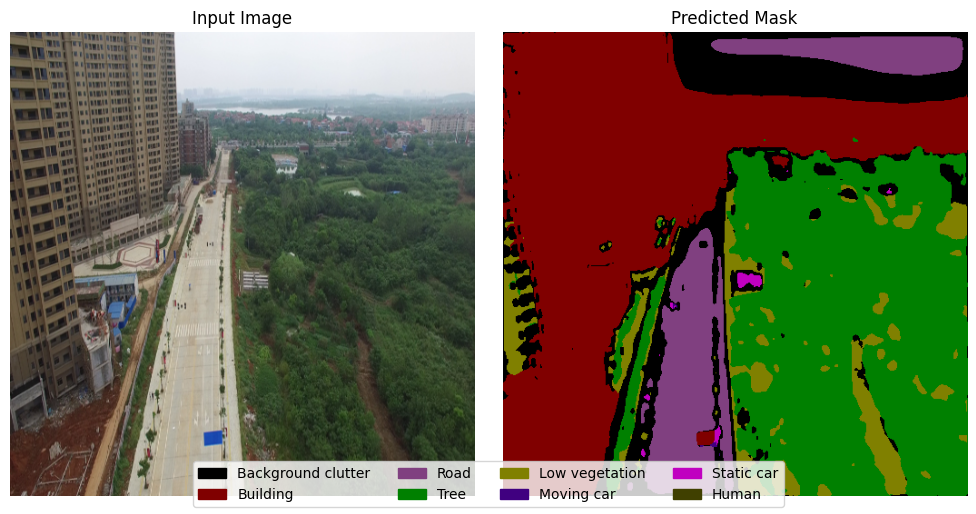

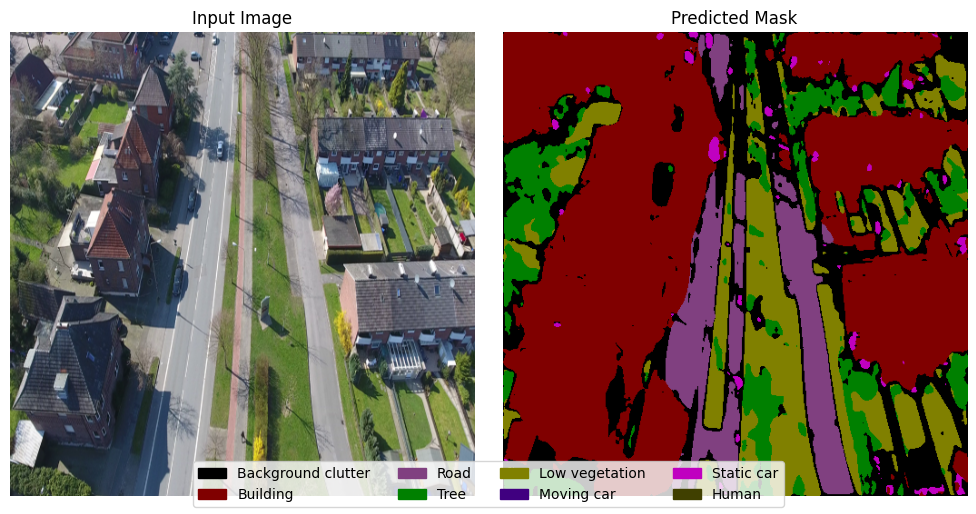

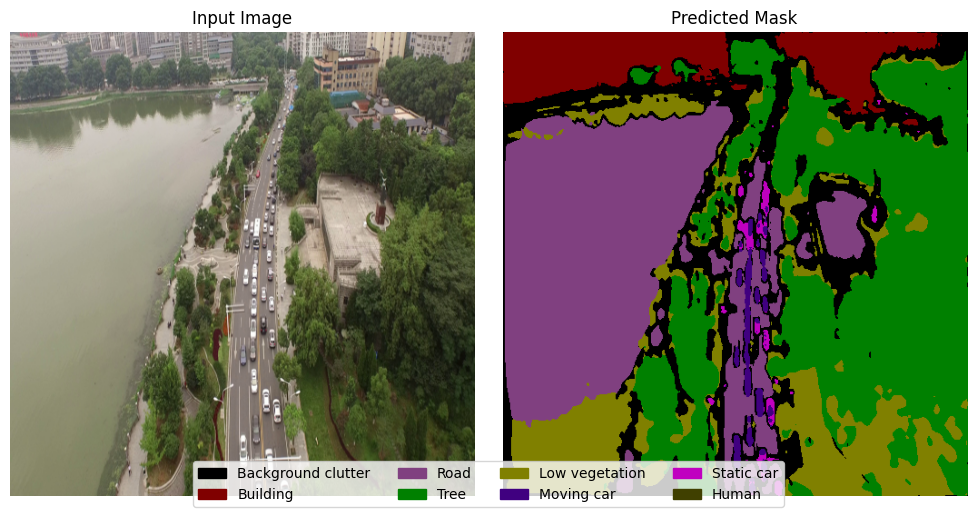

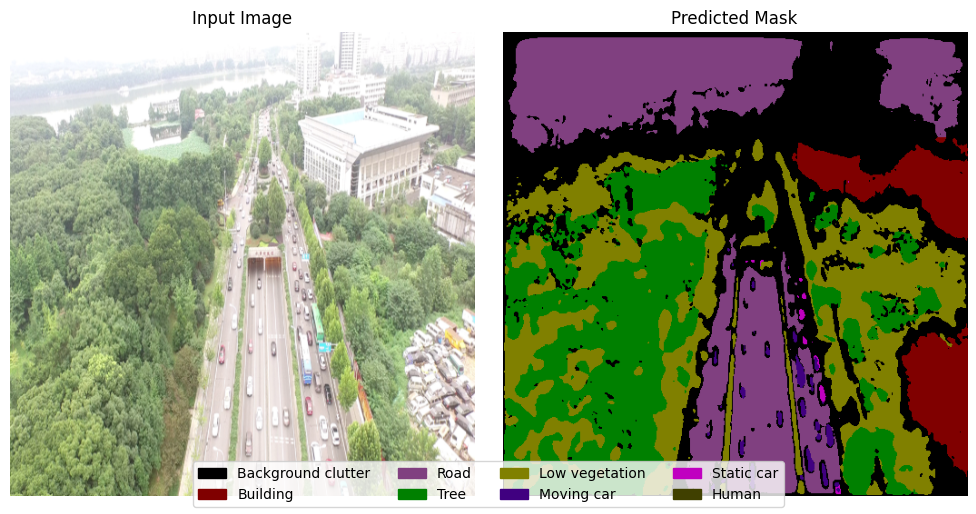

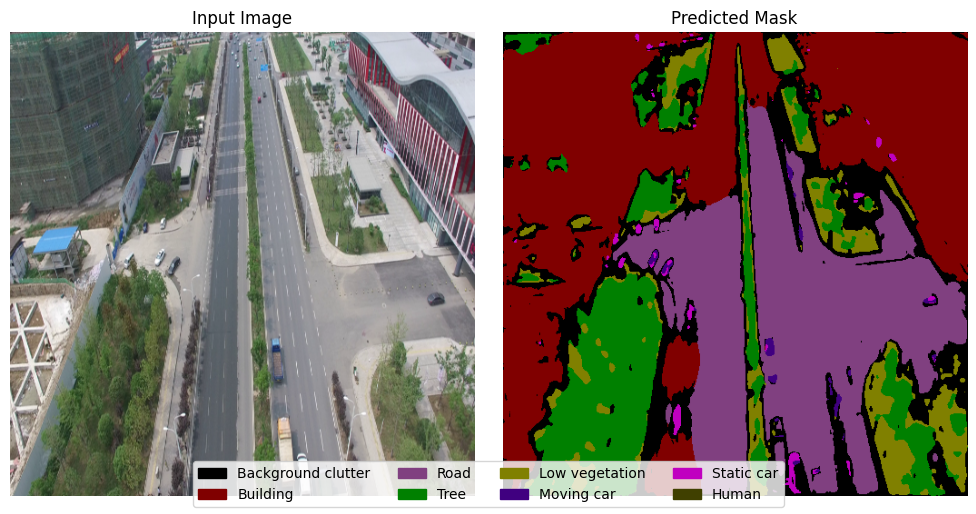

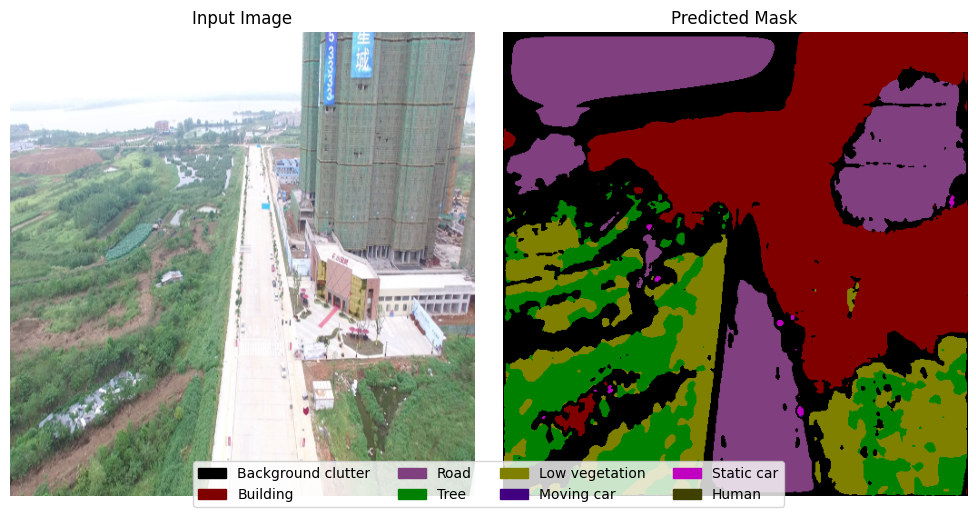

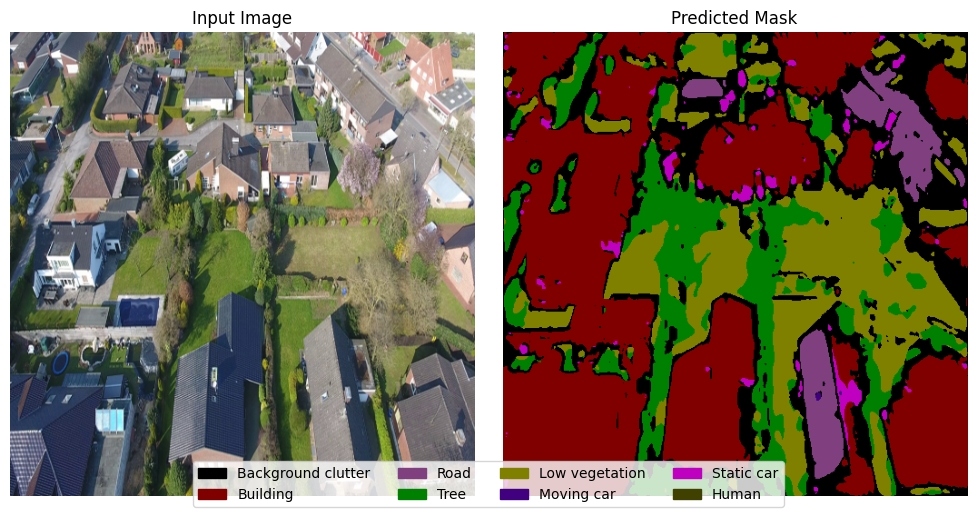

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import random

# UAVid Segmentation Classes and Corresponding RGB Colors
class_colors = {
    "Background clutter": (0, 0, 0),
    "Building": (128, 0, 0),
    "Road": (128, 64, 128),
    "Tree": (0, 128, 0),
    "Low vegetation": (128, 128, 0),
    "Moving car": (64, 0, 128),
    "Static car": (192, 0, 192),
    "Human": (64, 64, 0)
}

color_map = np.array(list(class_colors.values()), dtype=np.uint8)

def decode_segmap(mask):
    """Convert class index mask to RGB image based on UAVid color scheme."""
    rgb_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for i, color in enumerate(color_map):
        rgb_mask[mask == i] = color
    return rgb_mask

# Model Evaluation on Test Set (Selecting 10 Random Images)
model.eval()
num_images_to_display = 10
displayed_images = 0

# Create a list of all image indices (from test_loader)
image_indices = list(range(len(test_loader.dataset)))  # Assuming test_loader.dataset has the images

# Select 10 random indices from the dataset
random_indices = random.sample(image_indices, num_images_to_display)

for idx in random_indices:  # Loop through the selected random indices
    # Fetch the image from the test dataset (no need for ground truth in test)
    img = test_loader.dataset[idx]  # Assuming dataset returns just the image (no label)

    img = img.unsqueeze(0).to(device)  # Add batch dimension and move image to GPU

    with torch.no_grad():  # Disable gradient computation to save memory
        result = model(img)  # Predict on a single image

    mask = torch.argmax(result, axis=1).cpu().numpy()[0]  # Convert to NumPy

    # Prepare input image for display
    im = np.moveaxis(img.cpu().numpy()[0], 0, -1).copy() * 255
    im = im.astype(np.uint8)
    pred_mask_rgb = decode_segmap(mask)

    # Plot the input image and predicted mask
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(im)
    axs[0].set_title("Input Image")
    axs[0].axis("off")

    axs[1].imshow(pred_mask_rgb)
    axs[1].set_title("Predicted Mask")
    axs[1].axis("off")

    # Create a legend for class colors
    patches = [mpatches.Patch(color=np.array(color) / 255.0, label=cls) for cls, color in class_colors.items()]
    plt.figlegend(handles=patches, loc="lower center", ncol=4, fontsize=10)

    plt.tight_layout()
    plt.show()

    displayed_images += 1  # Increment counter

    if displayed_images >= num_images_to_display:
        break  # Stop after showing 10 images
